# Intro

Welcome to the interactive tracking notebook!\
This notebook goes through each step and allows you to tune parameters and view how it changes the results.

The notebook proceeds as follows:
1. **Import** libraries
2. Define **paths** to data
3. Run data through the **pipeline**. Each step of the pipeline is run by a single unique python class.
4. **Visualize** results
5. **Save** results

As you go through the notebook, take note of the small number of parameters that are mentioned as **'important parameters'** (consider searching for these in the notebook). We consider these to be the only parameters that can have a large effect on the run output. Other parameters matter and should be considered as well, but are less critical.

## JBW NOTE: kornia missing from requirements. Had to pip install seaprately.

# Import libraries

Widen the notebook

In [1]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>.container {width:95% !important; }</style>"))
display(HTML("<style>:root { --jp-notebook-max-width: 100% !important; }</style>"))

Import basic libraries

In [2]:
from pathlib import Path
import multiprocessing as mp
import tempfile

import numpy as np

Import `roicat`

In [3]:
%load_ext autoreload
%autoreload 2
import roicat

# Find paths to data

In this example we are using suite2p output files, but other data types can be used (CaImAn, etc.) \
See the notebook on ingesting diverse data: https://github.com/RichieHakim/ROICaT/blob/main/notebooks/jupyter/other/demo_data_importing.ipynb

Make a list containing the paths to all the input files.

In this example we are using suite2p, so the following are defined:
1. `paths_allStat`: a list to all the stat.npy files
2. `paths_allOps`: a list with ops.npy files that correspond 1-to-1 with the stat.npy files

In [4]:
dir_allOuterFolders = r'C:\Users\janet\Documents\20241007_email_tough_data_for_tracking'
# dir_allOuterFolders = r'/media/rich/bigSSD/analysis_data/statFiles_mouse_2_6/'

pathSuffixToStat = 'stat.npy'
pathSuffixToOps = 'ops.npy'

paths_allStat = roicat.helpers.find_paths(
    dir_outer=dir_allOuterFolders,
    reMatch=pathSuffixToStat,
    depth=10,
)[:]
paths_allStat = np.array(paths_allStat)[2::8]
paths_allOps  = [str(Path(path).resolve().parent / pathSuffixToOps) for path in paths_allStat]

print(f'paths to all stat files:');
[print(path) for path in paths_allStat];
print('');
print(f'paths to all ops files:');
[print(path) for path in paths_allOps];

paths to all stat files:
C:\Users\janet\Documents\20241007_email_tough_data_for_tracking\multiplane-ophys_721291_2024-04-16_08-21-40_processed_2024-10-04_06-02-38\1345884088\segmentation\suite2p\plane0\stat.npy
C:\Users\janet\Documents\20241007_email_tough_data_for_tracking\multiplane-ophys_721291_2024-04-17_11-02-16_processed_2024-10-04_08-38-33\1346117513\segmentation\suite2p\plane0\stat.npy
C:\Users\janet\Documents\20241007_email_tough_data_for_tracking\multiplane-ophys_721291_2024-04-22_08-38-58_processed_2024-10-04_08-38-37\1347164369\segmentation\suite2p\plane0\stat.npy
C:\Users\janet\Documents\20241007_email_tough_data_for_tracking\multiplane-ophys_721291_2024-04-23_08-20-25_processed_2024-10-04_08-38-06\1348159915\segmentation\suite2p\plane0\stat.npy
C:\Users\janet\Documents\20241007_email_tough_data_for_tracking\multiplane-ophys_721291_2024-04-24_08-13-29_processed_2024-10-04_09-12-48\1348170438\segmentation\suite2p\plane0\stat.npy
C:\Users\janet\Documents\20241007_email_tough

# Import data

**Important parameters**:
- `um_per_pixel` (float):
    - Resolution. 'micrometers per pixel' of the imaging field of view.

In [5]:
data = roicat.data_importing.Data_suite2p(
    paths_statFiles=paths_allStat[:],
    paths_opsFiles=paths_allOps[:],
    um_per_pixel=1.0,  ## IMPORTANT PARAMETER. Use a list of floats if values differ in each session.
    new_or_old_suite2p='new',
    type_meanImg='meanImg',
    verbose=True,
)

assert data.check_completeness(verbose=False)['tracking'], f"Data object is missing attributes necessary for tracking."

c:\users\janet\documents\github\roicat\roicat\util.py:350: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Starting: Importing FOV images from ops files
Completed: Set FOV_height and FOV_width successfully.
Completed: Imported 15 FOV images.
Setting FOV_images...
Completed: Set FOV_images for 15 sessions successfully.
Importing spatial footprints from stat files.


100%|██████████| 15/15 [00:00<00:00, 65.40it/s]


Imported 15 sessions of spatial footprints into sparse arrays.
Completed: Set spatialFootprints for 15 sessions successfully.
Completed: Created session_bool.
Completed: Created centroids.
Starting: Creating centered ROI images from spatial footprints...
Completed: Created ROI images.


**Note on subselecting ROIs**:

Generally, I recommend the following:
- Do not subselecting ROIs prior to tracking. Use all available ROIs for the entire tracking process.
- Then, after tracking, subsequently apply classification and inclusion criteria to remove bad ROIs. See the 'tracking_handling_outputs.ipynb' notebook for details.

However, if you want to subselect ROIs before tracking you can call `data.remove_ROIs_by_classLabel()`. Prior to doing this, you will first need to set the class labels in the `data` object by either calling `data.set_class_labels()` or providing the `paths_iscell` input argument (if using the `Data_suite2p` class). Code below:

```python
data.remove_rois_by_classLabel(classLabel_to_keep=1, verbose=True)
```

# Original data: 


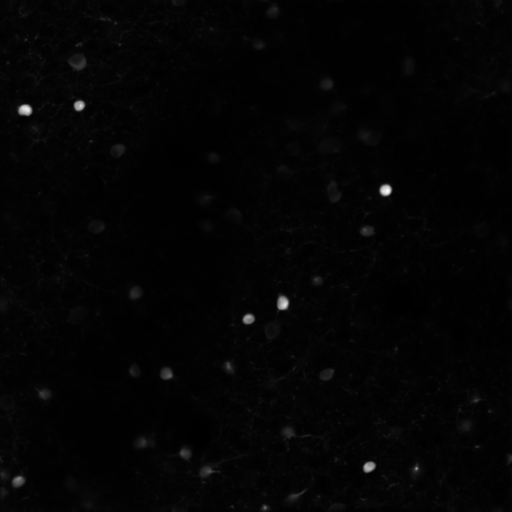


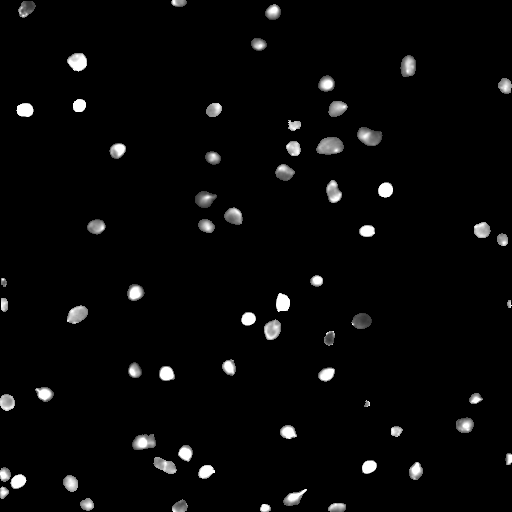


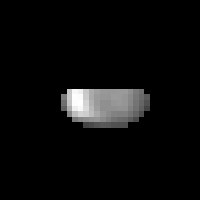

In [6]:
roicat.visualization.display_toggle_image_stack(data.FOV_images)
roicat.visualization.display_toggle_image_stack(data.get_maxIntensityProjection_spatialFootprints(), clim=[0,1])
roicat.visualization.display_toggle_image_stack(np.concatenate(data.ROI_images, axis=0)[:5000], image_size=(200,200))

# Augment a subset of the data to test alignment. Here, flipping two images then visualization

In [7]:
#augment two FOV_images by flipping them
import copy
data_copy = copy.deepcopy(data)

image_index = [0, 1]
for i in image_index:
    data_copy.FOV_images[i] = np.flip(data_copy.FOV_images[i], axis=1)




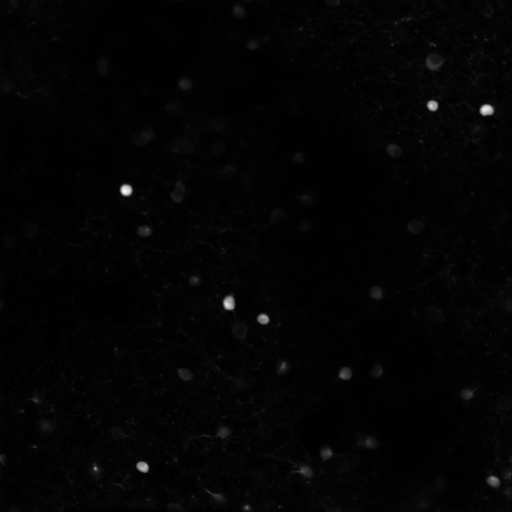

In [9]:
roicat.visualization.display_toggle_image_stack(data_copy.FOV_images)

### Set the device to run on

If you have a GPU, some steps can be sped up.

In [10]:
DEVICE = roicat.helpers.set_device(use_GPU=True)

Using device: cpu


# Alignment

This is the most important step in the pipeline to stop and check that everything looks okay and tune parameters if necessary. I strongly recommend reading the documentation for the methods for the `roicat.tracking.alignment.Aligner` class at each step.

Alignment is 4 steps:

1. FOV_image augmentation
2. Fit geometric transformation
3. Fit non-rigid transformation (on top of the geometric)
4. Apply transformation to ROIs

##### 1. FOV_image augmentation
Do what is necessary to make the augmented FOV_images look good. Use the visualization tool below to help. This can include playing with the mixing factor, normalization, and playing with the CLAHE parameters.

In [11]:
aligner = roicat.tracking.alignment.Aligner(
    radius_in=4,  ## IMPORTANT PARAMETER: Value in micrometers used to define the maximum shift/offset between two images that are considered to be aligned. Larger means more lenient alignment.
    radius_out=20,  ## Value in micrometers used to define the minimum shift/offset between two images that are considered to be misaligned.
    probability_threshold=1e-15,  ## IMPORTANT PARAMETER: Probability required to define two images as aligned. Smaller values results in more stringent alignment requirements.
    um_per_pixel=data.um_per_pixel[0],  ## Single value for um_per_pixel. data.um_per_pixel is typically a list of floats, so index out just one value.
    device=DEVICE,
    verbose=True,
)

c:\users\janet\documents\github\roicat\roicat\util.py:350: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


# Augmenting original FOV images

In [14]:
FOV_images_OG = aligner.augment_FOV_images(
    FOV_images=data.FOV_images,
    spatialFootprints=data.spatialFootprints,
    normalize_FOV_intensities=True,
    roi_FOV_mixing_factor=0.5,
    use_CLAHE=True,  ## IMPORTANT PARAMETER. Use Set to False if data is poor quality or poorly aligned.
    CLAHE_grid_block_size=4,  ## IMPORTANT PARAMETER. Use smaller values for higher precision but higher chance of failure.
    CLAHE_clipLimit=1.0,
    CLAHE_normalize=True,
)


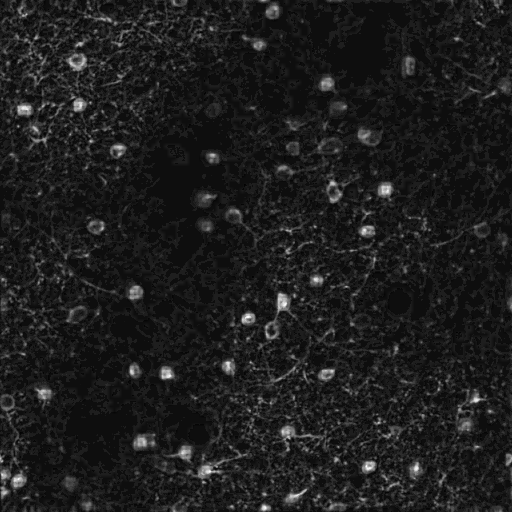

In [15]:
roicat.visualization.display_toggle_image_stack(FOV_images_OG)

# Processing with flipped FOV images

In [12]:
FOV_images = aligner.augment_FOV_images(
    FOV_images=data_copy.FOV_images,
    spatialFootprints=data_copy.spatialFootprints,
    normalize_FOV_intensities=True,
    roi_FOV_mixing_factor=0.5,
    use_CLAHE=True,  ## IMPORTANT PARAMETER. Use Set to False if data is poor quality or poorly aligned.
    CLAHE_grid_block_size=4,  ## IMPORTANT PARAMETER. Use smaller values for higher precision but higher chance of failure.
    CLAHE_clipLimit=1.0,
    CLAHE_normalize=True,
)

View the augmented FOV images


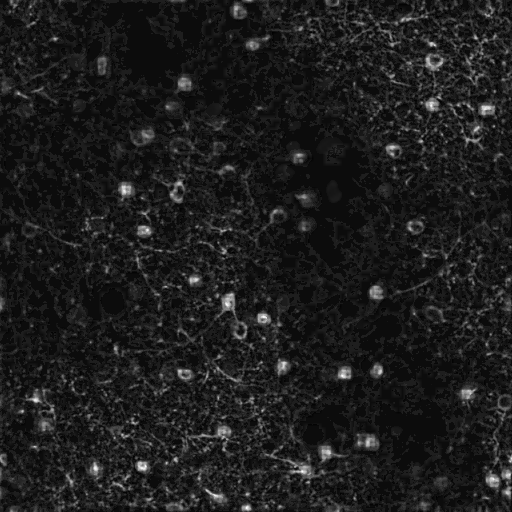

In [13]:
roicat.visualization.display_toggle_image_stack(FOV_images)

##### 2. Fit geometric transformation
Play with parameters until the aligned FOV_images look good. The visualization tool below can help. Please consider reading the documentation if you have any issues with the alignment step (TODO: link to readthedocs) for more details.

We like the following **important parameters**:
- `template`=0.5

In [167]:
# aligner.fit_geometric(
# #     template=FOV_images[4],
#     template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
#     ims_moving=FOV_images,  ## input images
#     template_method='image',  ## 'sequential': align images to neighboring images (good for drifting data). 'image': align to a single image
#     mode_transform='euclidean',  ## type of geometric transformation. See openCV's cv2.findTransformECC for details
#     mask_borders=(50, 50, 50, 50),  ## number of pixels to mask off the edges (top, bottom, left, right)
#     n_iter=200,  ## number of iterations for optimization
#     termination_eps=1e-09,  ## convergence tolerance
#     gaussFiltSize=81,  ## size of gaussian blurring filter applied to all images
#     auto_fix_gaussFilt_step=10,  ## increment in gaussFiltSize after a failed optimization
# )

# aligner.transform_images_geometric(FOV_images);

# Run the geometric transformation on the augmented FOV images

In [16]:
aligner.fit_geometric(
#     template=FOV_images[4],
    # template=int(11),  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=FOV_images[:],  ## input images
    template_method='image',  ## 'sequential': align images to neighboring images (good for drifting data). 'image': align to a single image
    mask_borders=(0, 0, 0, 0),  ## number of pixels to mask off the edges (top, bottom, left, right)
    algorithm='LoFTR',  ## 'LoFTR' or 'RANSAC'
    kwargs_algo_LoFTR = {
        'mode_transform': 'similarity',  ## type of geometric transformation. ('euclidean', 'similarity', 'affine', 'projective'). See skimage's estimate_transform for details.
        'gaussFiltSize': 0, ## size of gaussian blurring filter applied to all images
        'confidence_LoFTR': 0.2,  ## confidence threshold matched keypoints (LoFTR output) (0.2 )
        'device': DEVICE,
    }    
)

aligner.transform_images_geometric(FOV_images[:]);

Converting float fractional index to integer index: 0.5 -> 7
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

c:\Users\janet\anaconda3\envs\roicat\Lib\site-packages\kornia\feature\lightglue.py:44: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


Found 51 matches.
Found 51 matches.
Found 65 matches.
Found 65 matches.
Found 1360 matches.
Found 1360 matches.
Found 2183 matches.
Found 2183 matches.
Found 1894 matches.
Found 1894 matches.
Found 1896 matches.
Found 1896 matches.
Found 1880 matches.
Found 1880 matches.
Found 3600 matches.
Found 3600 matches.
Found 1610 matches.
Found 1610 matches.
Found 1926 matches.
Found 1926 matches.
Found 1635 matches.
Found 1635 matches.
Found 1641 matches.
Found 1641 matches.
Found 1359 matches.
Found 1359 matches.
Found 1515 matches.
Found 1515 matches.
Found 732 matches.
Found 732 matches.
Composing geometric warp matrices...
Attempting to find best matches for misaligned images...
Finding alignment between failed match idx: [0 1] and all other images...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 3600 matches.
Found 3600 matches.
Found 504 matches.
Found 504 matches.
Found 42 matches.
Found 42 matches.
Found 80 matches.
Found 80 matches.
Found 119 matches.
Found 119 matches.
Found 47 matches.
Found 47 matches.
Found 71 matches.
Found 71 matches.
Found 68 matches.
Found 68 matches.
Found 58 matches.
Found 58 matches.
Found 46 matches.
Found 46 matches.
Found 32 matches.
Found 32 matches.
Found 62 matches.
Found 62 matches.
Found 49 matches.
Found 49 matches.
Found 72 matches.
Found 72 matches.
Found 51 matches.
Found 51 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 582 matches.
Found 582 matches.
Found 3600 matches.
Found 3600 matches.
Found 32 matches.
Found 32 matches.
Found 48 matches.
Found 48 matches.
Found 71 matches.
Found 71 matches.
Found 55 matches.
Found 55 matches.
Found 49 matches.
Found 49 matches.
Found 46 matches.
Found 46 matches.
Found 75 matches.
Found 75 matches.
Found 47 matches.
Found 47 matches.
Found 34 matches.
Found 34 matches.
Found 43 matches.
Found 43 matches.
Found 48 matches.
Found 48 matches.
Found 53 matches.
Found 53 matches.
Found 78 matches.
Found 78 matches.
Composing geometric warp matrices...
Finding alignment between remaining images and all other images: [np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14)]...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


c:\users\janet\documents\github\roicat\roicat\tracking\alignment.py:500: UserWarning: Warning: Could not find a path to alignment for some images after one round of path finding. Now doing a dense search for alignment between all images.
  warnings.warn('Warning: Could not find a path to alignment for some images after one round of path finding. Now doing a dense search for alignment between all images.')


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 56 matches.
Found 56 matches.
Found 75 matches.
Found 75 matches.
Found 3600 matches.
Found 3600 matches.
Found 2000 matches.
Found 2000 matches.
Found 1484 matches.
Found 1484 matches.
Found 2624 matches.
Found 2624 matches.
Found 1720 matches.
Found 1720 matches.
Found 1371 matches.
Found 1371 matches.
Found 1488 matches.
Found 1488 matches.
Found 1502 matches.
Found 1502 matches.
Found 1678 matches.
Found 1678 matches.
Found 1041 matches.
Found 1041 matches.
Found 1569 matches.
Found 1569 matches.
Found 981 matches.
Found 981 matches.
Found 643 matches.
Found 643 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 88 matches.
Found 88 matches.
Found 90 matches.
Found 90 matches.
Found 1989 matches.
Found 1989 matches.
Found 3600 matches.
Found 3600 matches.
Found 2516 matches.
Found 2516 matches.
Found 1966 matches.
Found 1966 matches.
Found 2237 matches.
Found 2237 matches.
Found 2450 matches.
Found 2450 matches.
Found 1652 matches.
Found 1652 matches.
Found 1966 matches.
Found 1966 matches.
Found 1548 matches.
Found 1548 matches.
Found 1773 matches.
Found 1773 matches.
Found 1402 matches.
Found 1402 matches.
Found 1274 matches.
Found 1274 matches.
Found 1016 matches.
Found 1016 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 107 matches.
Found 107 matches.
Found 130 matches.
Found 130 matches.
Found 1527 matches.
Found 1527 matches.
Found 2452 matches.
Found 2452 matches.
Found 3600 matches.
Found 3600 matches.
Found 1233 matches.
Found 1233 matches.
Found 2263 matches.
Found 2263 matches.
Found 2177 matches.
Found 2177 matches.
Found 1497 matches.
Found 1497 matches.
Found 1967 matches.
Found 1967 matches.
Found 1537 matches.
Found 1537 matches.
Found 1865 matches.
Found 1865 matches.
Found 1157 matches.
Found 1157 matches.
Found 1717 matches.
Found 1717 matches.
Found 1148 matches.
Found 1148 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 49 matches.
Found 49 matches.
Found 69 matches.
Found 69 matches.
Found 2647 matches.
Found 2647 matches.
Found 1998 matches.
Found 1998 matches.
Found 1331 matches.
Found 1331 matches.
Found 3600 matches.
Found 3600 matches.
Found 2076 matches.
Found 2076 matches.
Found 1732 matches.
Found 1732 matches.
Found 1597 matches.
Found 1597 matches.
Found 1600 matches.
Found 1600 matches.
Found 1597 matches.
Found 1597 matches.
Found 1164 matches.
Found 1164 matches.
Found 1310 matches.
Found 1310 matches.
Found 1120 matches.
Found 1120 matches.
Found 630 matches.
Found 630 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 84 matches.
Found 84 matches.
Found 106 matches.
Found 106 matches.
Found 1927 matches.
Found 1927 matches.
Found 2367 matches.
Found 2367 matches.
Found 2214 matches.
Found 2214 matches.
Found 1880 matches.
Found 1880 matches.
Found 3600 matches.
Found 3600 matches.
Found 1844 matches.
Found 1844 matches.
Found 1574 matches.
Found 1574 matches.
Found 2021 matches.
Found 2021 matches.
Found 1600 matches.
Found 1600 matches.
Found 1576 matches.
Found 1576 matches.
Found 1476 matches.
Found 1476 matches.
Found 1536 matches.
Found 1536 matches.
Found 1095 matches.
Found 1095 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 51 matches.
Found 51 matches.
Found 65 matches.
Found 65 matches.
Found 1360 matches.
Found 1360 matches.
Found 2183 matches.
Found 2183 matches.
Found 1894 matches.
Found 1894 matches.
Found 1896 matches.
Found 1896 matches.
Found 1880 matches.
Found 1880 matches.
Found 3600 matches.
Found 3600 matches.
Found 1610 matches.
Found 1610 matches.
Found 1926 matches.
Found 1926 matches.
Found 1635 matches.
Found 1635 matches.
Found 1641 matches.
Found 1641 matches.
Found 1359 matches.
Found 1359 matches.
Found 1515 matches.
Found 1515 matches.
Found 732 matches.
Found 732 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 59 matches.
Found 59 matches.
Found 77 matches.
Found 77 matches.
Found 1574 matches.
Found 1574 matches.
Found 1806 matches.
Found 1806 matches.
Found 1523 matches.
Found 1523 matches.
Found 1628 matches.
Found 1628 matches.
Found 1676 matches.
Found 1676 matches.
Found 1736 matches.
Found 1736 matches.
Found 3600 matches.
Found 3600 matches.
Found 1919 matches.
Found 1919 matches.
Found 1995 matches.
Found 1995 matches.
Found 1413 matches.
Found 1413 matches.
Found 1929 matches.
Found 1929 matches.
Found 1225 matches.
Found 1225 matches.
Found 1020 matches.
Found 1020 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 57 matches.
Found 57 matches.
Found 67 matches.
Found 67 matches.
Found 1646 matches.
Found 1646 matches.
Found 2058 matches.
Found 2058 matches.
Found 1950 matches.
Found 1950 matches.
Found 1732 matches.
Found 1732 matches.
Found 2170 matches.
Found 2170 matches.
Found 2051 matches.
Found 2051 matches.
Found 2065 matches.
Found 2065 matches.
Found 3600 matches.
Found 3600 matches.
Found 2301 matches.
Found 2301 matches.
Found 2326 matches.
Found 2326 matches.
Found 2061 matches.
Found 2061 matches.
Found 2185 matches.
Found 2185 matches.
Found 1615 matches.
Found 1615 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 59 matches.
Found 59 matches.
Found 87 matches.
Found 87 matches.
Found 1733 matches.
Found 1733 matches.
Found 1525 matches.
Found 1525 matches.
Found 1569 matches.
Found 1569 matches.
Found 1668 matches.
Found 1668 matches.
Found 1640 matches.
Found 1640 matches.
Found 1708 matches.
Found 1708 matches.
Found 1889 matches.
Found 1889 matches.
Found 2463 matches.
Found 2463 matches.
Found 3600 matches.
Found 3600 matches.
Found 1964 matches.
Found 1964 matches.
Found 1786 matches.
Found 1786 matches.
Found 1885 matches.
Found 1885 matches.
Found 597 matches.
Found 597 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 64 matches.
Found 64 matches.
Found 86 matches.
Found 86 matches.
Found 1042 matches.
Found 1042 matches.
Found 1791 matches.
Found 1791 matches.
Found 1889 matches.
Found 1889 matches.
Found 1238 matches.
Found 1238 matches.
Found 1590 matches.
Found 1590 matches.
Found 1709 matches.
Found 1709 matches.
Found 1277 matches.
Found 1277 matches.
Found 2107 matches.
Found 2107 matches.
Found 1977 matches.
Found 1977 matches.
Found 3600 matches.
Found 3600 matches.
Found 1291 matches.
Found 1291 matches.
Found 2071 matches.
Found 2071 matches.
Found 1169 matches.
Found 1169 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 88 matches.
Found 88 matches.
Found 61 matches.
Found 61 matches.
Found 1835 matches.
Found 1835 matches.
Found 1590 matches.
Found 1590 matches.
Found 1291 matches.
Found 1291 matches.
Found 1576 matches.
Found 1576 matches.
Found 1625 matches.
Found 1625 matches.
Found 1478 matches.
Found 1478 matches.
Found 2063 matches.
Found 2063 matches.
Found 2154 matches.
Found 2154 matches.
Found 1939 matches.
Found 1939 matches.
Found 1421 matches.
Found 1421 matches.
Found 3600 matches.
Found 3600 matches.
Found 1500 matches.
Found 1500 matches.
Found 1470 matches.
Found 1470 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 80 matches.
Found 80 matches.
Found 75 matches.
Found 75 matches.
Found 1063 matches.
Found 1063 matches.
Found 1365 matches.
Found 1365 matches.
Found 1764 matches.
Found 1764 matches.
Found 1105 matches.
Found 1105 matches.
Found 1610 matches.
Found 1610 matches.
Found 1582 matches.
Found 1582 matches.
Found 1025 matches.
Found 1025 matches.
Found 2190 matches.
Found 2190 matches.
Found 1817 matches.
Found 1817 matches.
Found 2146 matches.
Found 2146 matches.
Found 1351 matches.
Found 1351 matches.
Found 3600 matches.
Found 3600 matches.
Found 1002 matches.
Found 1002 matches.
Composing geometric warp matrices...
Finding geometric registration warps with template_method: image, mask_borders: True, algorithm: LoFTR


Finding geometric registration warps:   0%|          | 0/15 [00:00<?, ?it/s]

Found 51 matches.
Found 51 matches.
Found 98 matches.
Found 98 matches.
Found 777 matches.
Found 777 matches.
Found 1385 matches.
Found 1385 matches.
Found 1294 matches.
Found 1294 matches.
Found 851 matches.
Found 851 matches.
Found 1154 matches.
Found 1154 matches.
Found 683 matches.
Found 683 matches.
Found 998 matches.
Found 998 matches.
Found 1648 matches.
Found 1648 matches.
Found 493 matches.
Found 493 matches.
Found 1378 matches.
Found 1378 matches.
Found 1452 matches.
Found 1452 matches.
Found 1100 matches.
Found 1100 matches.
Found 3600 matches.
Found 3600 matches.
Composing geometric warp matrices...


c:\users\janet\documents\github\roicat\roicat\tracking\alignment.py:513: UserWarning: Warning: Could not find a path to alignment for some images after dense search. Returning the original warp matrices directly between each image and the template. 
See
  warnings.warn('Warning: Could not find a path to alignment for some images after dense search. Returning the original warp matrices directly between each image and the template. \nSee')


Applying geometric registration warps to images...


##### 3. Fit non-rigid transformation
Play with parameters until the aligned FOV_images look good. The visualization tool below can help.

We like the following **important parameters**:
- `template`=0.5
- `template_method`='image'


In [17]:
aligner.fit_nonrigid(
#     template=FOV_images[1],
    template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=aligner.ims_registered_geo,  ## Input images. Typically the geometrically registered images
    remappingIdx_init=aligner.remappingIdx_geo,  ## The remappingIdx between the original images (and ROIs) and ims_moving
    template_method='image',  ## 'sequential': align images to neighboring images. 'image': align to a single image, good if using geometric registration first
    mode_transform='createOptFlow_DeepFlow',  ## algorithm for non-rigid transformation. Either 'createOptFlow_DeepFlow' or 'calcOpticalFlowFarneback'. See openCV docs for each. 
    kwargs_mode_transform=None,  ## kwargs for `mode_transform`
)

Converting float fractional index to integer index: 0.5 -> 7
Finding nonrigid registration warps with mode: createOptFlow_DeepFlow, template_method: image


Finding nonrigid registration warps:   0%|          | 0/15 [00:00<?, ?image/s]

Composing nonrigid warp matrices...


array([[[[         nan,   0.        ],
         [         nan,   0.        ],
         [ 95.80911923,  64.24686473],
         ...,
         [497.59647731,  54.67620886],
         [498.38859844,  54.65454799],
         [499.18088456,  54.63272713]],

        [[         nan,   0.        ],
         [         nan,   0.        ],
         [ 95.83113959,  65.0393641 ],
         ...,
         [497.61832911,  55.46845139],
         [498.41057119,  55.44678869],
         [499.20295374,  55.4249542 ]],

        [[         nan,   0.        ],
         [         nan,   0.        ],
         [ 95.85299676,  65.83190031],
         ...,
         [497.64045412,  56.26094692],
         [498.43276312,  56.23907854],
         [499.22524242,  56.21724176]],

        ...,

        [[         nan,   0.        ],
         [         nan,   0.        ],
         [         nan,   0.        ],
         ...,
         [         nan,   0.        ],
         [         nan,   0.        ],
         [         nan,   0

In [18]:
aligner.transform_images_nonrigid(FOV_images);

Applying nonrigid registration warps to images...


##### 4. Transform ROIs

In [19]:
aligner.transform_ROIs(
    ROIs=data.spatialFootprints, 
    remappingIdx=aligner.remappingIdx_nonrigid,
    normalize=True,
);

Registering ROIs...


Registering ROIs:   0%|          | 0/15 [00:00<?, ?it/s]

c:\users\janet\documents\github\roicat\roicat\tracking\alignment.py:900: RuntimeWarning: divide by zero encountered in divide
  rois_aligned = rois_aligned.multiply(1/rois_aligned.sum(1))


Ensure that the aligned FOVs look aligned

Pre-alignment below



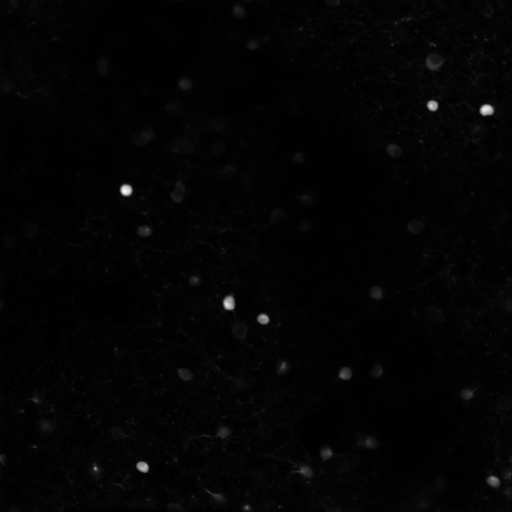

Geometric alignment below



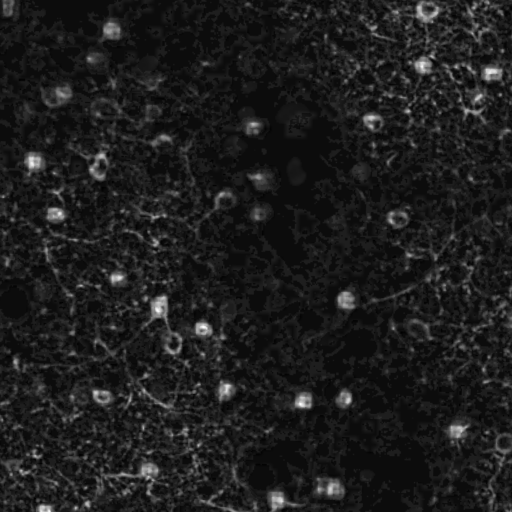

Non-rigid alignment below



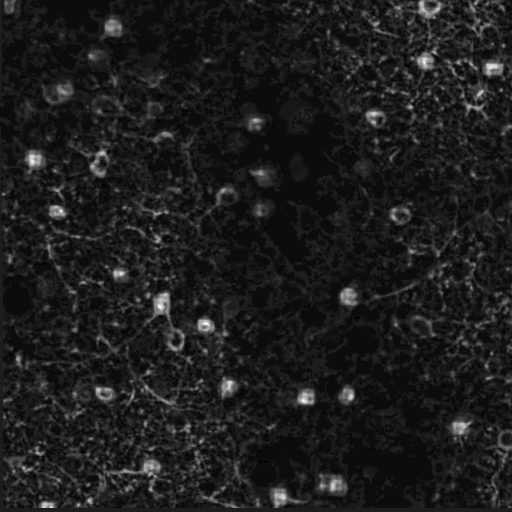

Transformed ROIs below



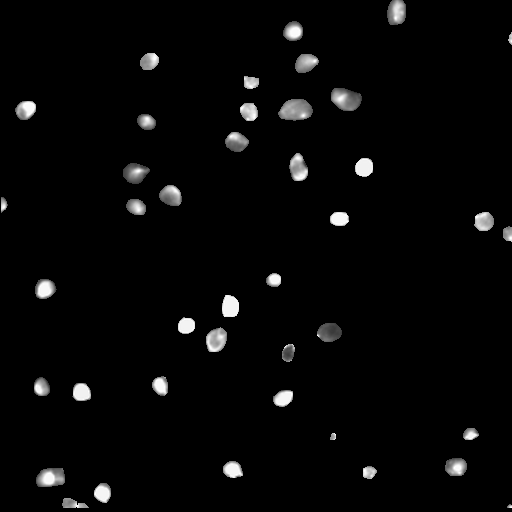

In [20]:
print(f'Pre-alignment below')
roicat.visualization.display_toggle_image_stack(data_copy.FOV_images)
print(f'Geometric alignment below')
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_geo)
print(f'Non-rigid alignment below')
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_nonrigid)
print(f'Transformed ROIs below')
roicat.visualization.display_toggle_image_stack(aligner.get_ROIsAligned_maxIntensityProjection(normalize=True), clim=None)

In [21]:
import matplotlib.pyplot as plt

In [22]:
um_per_pixel = 1.4
p_thresh = 0.01
DEVICE = roicat.helpers.set_device(use_GPU=True)


n_images = len(FOV_images)
hw = tuple(FOV_images[0].shape)
z_thresh = roicat.helpers.pvalue_to_zscore(p_thresh, two_tailed=False)

iac = roicat.tracking.alignment.ImageAlignmentChecker(
    hw=hw,
    radius_in=4 * um_per_pixel,
    radius_out=50 * um_per_pixel,
    order=5,
    device=DEVICE,
)

alignment_matrix = iac.score_alignment(
    # FOV_images[0],
    np.stack(FOV_images),
)['z_in']

Using device: cpu


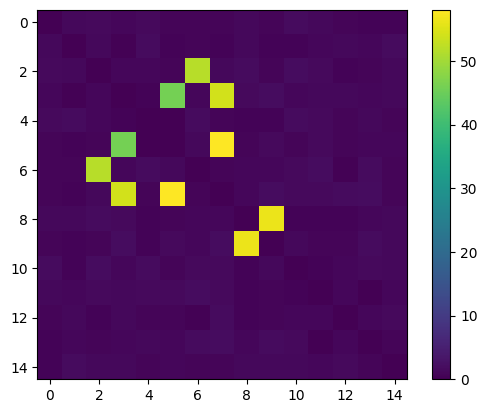

In [23]:
plt.figure()
plt.imshow(alignment_matrix * (1 - np.eye(alignment_matrix.shape[0])))
plt.colorbar()

In [24]:
z_matrix = iac.score_alignment(
    np.stack(FOV_images),
    FOV_images[0],
)['z_in']

In [25]:
z_matrix.shape

(15, 1)

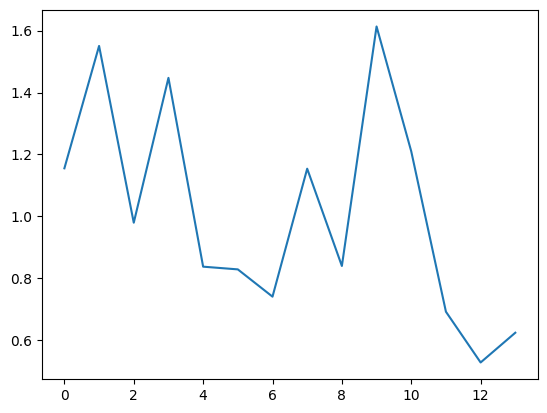

In [26]:
plt.figure()
plt.plot(z_matrix[1:])

Pre-alignment below



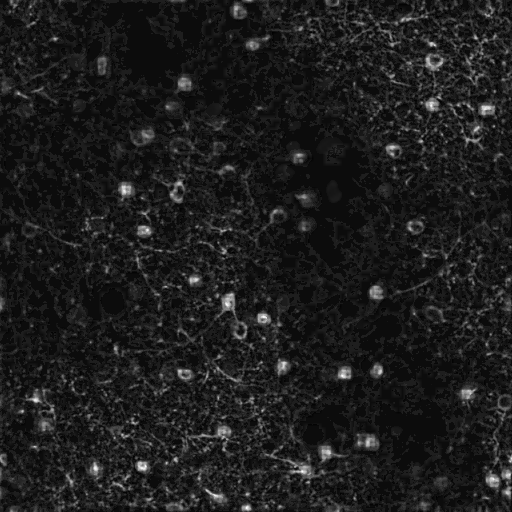

In [27]:
print(f'Pre-alignment below')
roicat.visualization.display_toggle_image_stack([FOV_images[ii] for ii in [0, 1]])

# Blur ROIs

ROIs from different sessions with zero spatial overlap have very low probability of being considered the same ROI during the clustering step. Blurring the spatial footprint masks can increase the overlap between ROIs that drift apart from each other. It's a good idea to increase the `kernel_halfWidth` if you are working with sparsely labeled ROIs or ROIs that change/move from session to session.

In [28]:
blurrer = roicat.tracking.blurring.ROI_Blurrer(
    frame_shape=(data.FOV_height, data.FOV_width),  ## FOV height and width
    kernel_halfWidth=4,  ## The half width of the 2D gaussian used to blur the ROI masks
    plot_kernel=False,  ## Whether to visualize the 2D gaussian
)

blurrer.blur_ROIs(
    spatialFootprints=aligner.ROIs_aligned[:],
);

c:\users\janet\documents\github\roicat\roicat\util.py:350: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Preparing the Toeplitz convolution matrix
Performing convolution for blurring


See that the blurred ROIs are overlapping each other


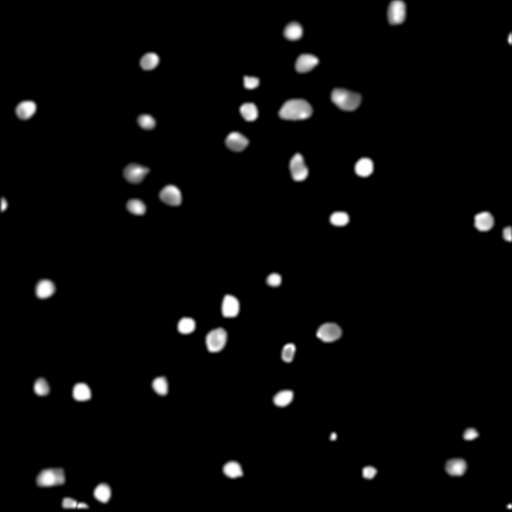

In [29]:
roicat.visualization.display_toggle_image_stack(blurrer.get_ROIsBlurred_maxIntensityProjection())

# ROInet embedding

This step passes the images of each ROI through the ROInet neural network. The inputs are the images, the output is an array describing the visual properties of each ROI.

Initialize the ROInet object. The `ROInet_embedder` class will automatically download and load a pretrained ROInet model. If you have a GPU, this step will be much faster.

In [30]:
dir_temp = tempfile.gettempdir()

roinet = roicat.ROInet.ROInet_embedder(
    device=DEVICE,  ## Which torch device to use ('cpu', 'cuda', etc.)
    dir_networkFiles=dir_temp,  ## Directory to download the pretrained network to
    download_method='check_local_first',  ## Check to see if a model has already been downloaded to the location (will skip if hash matches)
    download_url='https://osf.io/x3fd2/download',  ## URL of the model
    download_hash='7a5fb8ad94b110037785a46b9463ea94',  ## Hash of the model file
    forward_pass_version='latent',  ## How the data is passed through the network
    verbose=True,  ## Whether to print updates
)

File already exists locally: C:\Users\janet\AppData\Local\Temp\ROInet.zip
Hash of local file matches provided hash_hex.
Extracting C:\Users\janet\AppData\Local\Temp\ROInet.zip to C:\Users\janet\AppData\Local\Temp.
Completed zip extraction.
Imported model from C:\Users\janet\AppData\Local\Temp\ROInet_tracking_20220527\model.py
Loaded params_model from C:\Users\janet\AppData\Local\Temp\ROInet_tracking_20220527\params.json


c:\Users\janet\anaconda3\envs\roicat\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\janet\anaconda3\envs\roicat\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Generated network using params_model
Loaded state_dict into network from C:\Users\janet\AppData\Local\Temp\ROInet_tracking_20220527\ConvNext_tiny__1_0_best__simCLR.pth
Loaded network onto device cpu


Resize ROIs and prepare a dataloader.

**Important parameters**:
- `um_per_pixel`: (same as specified in `data` object). Resolution of FOV. This is used to resize the ROIs to be relatively consistent across resolutions.

In [31]:
roinet.generate_dataloader(
    ROI_images=data.ROI_images,  ## Input images of ROIs
    um_per_pixel=data.um_per_pixel,  ## Resolution of FOV
    pref_plot=False,  ## Whether or not to plot the ROI sizes
    
    jit_script_transforms=False,  ## (advanced) Whether or not to use torch.jit.script to speed things up
    
    batchSize_dataloader=8,  ## (advanced) PyTorch dataloader batch_size
    pinMemory_dataloader=True,  ## (advanced) PyTorch dataloader pin_memory
    numWorkers_dataloader=mp.cpu_count(),  ## (advanced) PyTorch dataloader num_workers
    persistentWorkers_dataloader=True,  ## (advanced) PyTorch dataloader persistent_workers
    prefetchFactor_dataloader=2,  ## (advanced) PyTorch dataloader prefetch_factor
);

Starting Image Resizer


c:\users\janet\documents\github\roicat\roicat\util.py:350: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Creating dataloader
Defined image transformations: Sequential(
  (0): ScaleDynamicRange(scaler_bounds=(0, 1))
  (1): Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
  (2): TileChannels(dim=0)
)
Defined dataset
Defined dataloader


In general, you want to see that a neuron fills roughly 25-50% of the area of the image.


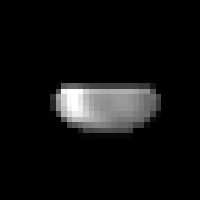

In [32]:
roicat.visualization.display_toggle_image_stack(roinet.ROI_images_rs[:1000], image_size=(200,200))

Pass the data through the network. Expect for large datasets (~40,000 ROIs) that this takes around 15 minutes on CPU or 1 minute on GPU.

In [33]:
roinet.generate_latents();

starting: running data through network


  0%|          | 0/141 [00:00<?, ?it/s]

completed: running data through network


# Scattering wavelet embedding

This is similar to the ROInet embedding in purpose.

In [34]:
swt = roicat.tracking.scatteringWaveletTransformer.SWT(
    kwargs_Scattering2D={'J': 2, 'L': 12},  ## 'J' is the number of convolutional layers. 'L' is the number of wavelet angles.
    image_shape=data.ROI_images[0].shape[1:3],  ## size of a cropped ROI image
    device=DEVICE,  ## PyTorch device
)

swt.transform(
    ROI_images=roinet.ROI_images_rs,  ## All the cropped and resized ROI images
    batch_size=100,  ## Batch size for each iteration (smaller is less memory but slower)
);

SWT initialized
Starting: SWT transform on ROIs


12it [00:06,  1.82it/s]                           


Completed: SWT transform on ROIs


# Compute similarities

Now we can compare the similarities of the ROIs. This includes calculating 4 kinds of similarities:
1. `s_sf`: 'similarity spatial footprint'. The physical overlap between ROIs.
2. `s_NN`: 'similarity neural network'. The similarities of the embeddings out of ROInet.
3. `s_SWT`: 'similarity scaterring wavelet transform'. The similarities of the embeddings out of the scattering wavelet transformer.
4. `s_sesh`: 'similarity sessions'. 0 if from the same session, 1 if from different sessions. ROIs from the same session have 0 probability of being the same.

The result of this step will be a set of pairwise similarity matrices.

Initialize the `ROI_graph` class and compute similarities.
To make computation more efficient, only ROIs within the same 'block' are compared against each other.

c:\users\janet\documents\github\roicat\roicat\util.py:350: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Computing pairwise similarity between ROIs...


100%|██████████| 16/16 [00:00<00:00, 19.07it/s]

Joining blocks into full similarity matrices...
Joining s_sf...
Joining s_NN...
Joining s_SWT...
Joining s_sesh...


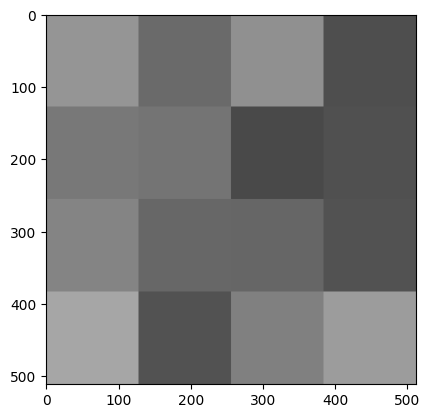

In [35]:
sim = roicat.tracking.similarity_graph.ROI_graph(
    n_workers=-1,  ## Number of CPU cores to use. -1 for all.
    frame_height=data.FOV_height,
    frame_width=data.FOV_width,
    block_height=128,  ## size of a block
    block_width=128,  ## size of a block
    algorithm_nearestNeigbors_spatialFootprints='brute',  ## algorithm used to find the pairwise similarity for s_sf. ('brute' is slow but exact. See docs for others.)
    verbose=True,  ## Whether to print outputs
)

sim.visualize_blocks()

s_sf, s_NN, s_SWT, s_sesh = sim.compute_similarity_blockwise(
    spatialFootprints=blurrer.ROIs_blurred,  ## Mask spatial footprints
    features_NN=roinet.latents,  ## ROInet output latents
    features_SWT=swt.latents,  ## Scattering wavelet transform output latents
    ROI_session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
    spatialFootprint_maskPower=1.0,  ##  An exponent to raise the spatial footprints to to care more or less about bright pixels
);

It is useful to normalize the similarity matrices using the local ROIs.

In [36]:
sim.make_normalized_similarities(
    centers_of_mass=data.centroids,  ## ROI centroid positions
    features_NN=roinet.latents,  ## ROInet latents
    features_SWT=swt.latents,  ## SWT latents
    k_max=data.n_sessions*100,  ## Maximum number of nearest neighbors to consider for the normalizing distribution
    k_min=data.n_sessions*10,  ## Minimum number of nearest neighbors to consider for the normalizing distribution
    algo_NN='kd_tree',  ## Nearest neighbors algorithm to use
    device=DEVICE,
)

Finding k-range of center of mass distance neighbors for each ROI...
Normalizing Neural Network similarity scores...


100%|██████████| 1125/1125 [00:00<00:00, 6445.27it/s]


Normalizing SWT similarity scores...


100%|██████████| 1125/1125 [00:03<00:00, 287.26it/s]


# Clustering

This step does the following:
1. Mix the similarity matrices into a single distance matrix
2. Prune the distance matrix to remove low probability connections
3. Perform clustering
4. Compute quality metrics

#### 1. Mix the similarity matrices into a single distance matrix

This step can be done either automatically, using the `clusterer.find_optimal_parameters_for_pruning` method, or manually by specifying the `kwargs_makeConjunctiveDistanceMatrix` dictionary. If you have a smaller total number of ROIs (<100 ROIs per session and/or <8 sessions), then it may be a good idea to manually play with the parameters in the next cell instead of using the automatic method.

<br></br>

##### Option A: Automatic Method
This step finds the optimal parameters to mix the similarity matrices by tuning mixing parameters to maximally separate the distributions of pairwise similarities for ROI pairs known to be different and ROI pairs that are likely matched.

Some of the details of underlying algorithm:
1. For each step in the optimization process, all the similarity matrices (`s_sf`, `s_NN_z`, `s_SWT_z`, `s_sesh`) are each passed through a sigmoid activation function that is parameterized (e.g. `'power_SF'`, `'sig_SF_kwargs'`), then all the similarity matrices are combined using a p-norm, where the 'p' is parameterized with `'p_norm'`. This results in a single conjunctive similarity matrix called `sConj` bounded between 0-1. 
2. `sConj` is converted into a distance matrix `dConj` (bounded from 1-0).
3. `dConj` is then passed through the objective function: The full distance matrix is separated into a few components. First, all pairs of ROIs that are known to be from 'different' sources because they are from the same session are separated out into a distribution of pairwise distances (`d_diff`). Second, we define pairs of ROIs that are likely to be from the same source as `d_same` = `d_all` - `d_diff`. The objective function is then the overlap between the `d_diff` and `d_same` distributions. 
4. The objective function is minimized by tuning the mixing parameters in `kwargs_makeConjunctiveDistanceMatrix`.
5. The output of this step is the optimal `kwargs_makeConjunctiveDistanceMatrix` dictionary.

<br></br>

##### Option B: Manual Method
You can also simply specify the `kwargs_makeConjunctiveDistanceMatrix` dictionary manually. This is useful if you have a good idea of what the optimal parameters are or if the automatic method is not working well. Uncomment the code block below to overwrite the `kwargs_mcdm_tmp` variable.

<br></br>

#### TROUBLESHOOTING FOR THIS STEP
- If you have any issues, just email Rich Hakim or open an issue on the github issues page.
- If you see: `'No crossover found, not plotting'`: Your data may not be easily separable. For some people, this is because the number of matching ROIs is very low compared to the number of non-matching ROIs. I recommend trying out the manual method.

In [37]:
## Initialize the clusterer object by passing the similarity matrices in
clusterer = roicat.tracking.clustering.Clusterer(
    s_sf=sim.s_sf,
    s_NN_z=sim.s_NN_z,
    s_SWT_z=sim.s_SWT_z,
    s_sesh=sim.s_sesh,
    verbose=1,
)

c:\users\janet\documents\github\roicat\roicat\util.py:350: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


#### Automatic method

In [38]:
# Uncomment below to automatically find mixing parameters
kwargs_makeConjunctiveDistanceMatrix_best = clusterer.find_optimal_parameters_for_pruning(
    n_bins=None,  ## Number of bins to use for the histograms of the distributions. If None, then a heuristic is used.
    smoothing_window_bins=None,  ## Number of bins to use to smooth the distributions. If None, then a heuristic is used.
    kwargs_findParameters={
        'n_patience': 300,  ## Number of optimization epoch to wait for tol_frac to converge
        'tol_frac': 0.001,  ## Fractional change below which optimization will conclude
        'max_trials': 120,  ## Max number of optimization epochs
        'max_duration': 60*10,  ## Max amount of time (in seconds) to allow optimization to proceed for
        'value_stop': 0.0,  ## Goal value. If value equals or goes below value_stop, optimization is stopped.
    },
    bounds_findParameters={
        'power_NN': (0.0, 2.),  ## Bounds for the exponent applied to s_NN
        'power_SWT': (0.0, 2.),  ## Bounds for the exponent applied to s_SWT
        'p_norm': (-5, -0.1),  ## Bounds for the p-norm p value (Minkowski) applied to mix the matrices
        'sig_NN_kwargs_mu': (0., 1.0),  ## Bounds for the sigmoid center for s_NN
        'sig_NN_kwargs_b': (0.1, 1.5),  ## Bounds for the sigmoid slope for s_NN
        'sig_SWT_kwargs_mu': (0., 1.0),  ## Bounds for the sigmoid center for s_SWT
        'sig_SWT_kwargs_b': (0.1, 1.5),  ## Bounds for the sigmoid slope for s_SWT
    },
    n_jobs_findParameters=-1,  ## Number of CPU cores to use (-1 is all cores)
)

Finding mixing parameters using automated hyperparameter tuning...


  0%|          | 0/120 [00:00<?, ?it/s]

Best value found: 3068.33349609375 with parameters {'power_NN': 0.25884726546686365, 'power_SWT': 0.49613464608823765, 'p_norm': -2.8790937516307897, 'sig_NN_kwargs': {'mu': 0.9169638843210564, 'b': 0.5213418971770645}, 'sig_SWT_kwargs': {'mu': 0.766044048521844, 'b': 0.12665463021170956}}


#### Manual method

In [36]:
# # Uncomment below to manually specify mixing parameters
# kwargs_makeConjunctiveDistanceMatrix_best = {
#     'power_SF': 1.0,   ## s_sf**power_SF   (Higher values means clustering is more sensitive to spatial overlap of ROIs)
#     'power_NN': 4.988104678381475,   ## s_NN**power_NN   (Higher values means clustering is more sensitive to visual similarity of ROIs)
#     'power_SWT': 3.2306101591115177,  ## s_SWT**power_SWT (Higher values means clustering is more sensitive to visual similarity of ROIs)
#     'p_norm': -3.7239759637888254,    ## norm([s_sf, s_NN, s_SWT], p=p_norm) (Higher values means clustering requires all similarity metrics to be high)
# #     'sig_SF_kwargs': {'mu':0.5, 'b':1.0},  ## Sigmoid parameters for s_sf (mu is the center, b is the slope)
#     'sig_SF_kwargs': None,
#     'sig_NN_kwargs': {'mu':0.022482651499435957, 'b':0.02659655318391102},    ## Sigmoid parameters for s_NN (mu is the center, b is the slope)
# #     'sig_NN_kwargs': None,
#     'sig_SWT_kwargs': {'mu':0.10929602726304388, 'b':0.25801625013167434}, ## Sigmoid parameters for s_SWT (mu is the center, b is the slope)
# #     'sig_SWT_kwargs': None,
# }

#### View mixing results
The goal is to see a **bimodal curve** in the pairwise similarities and a **clear cross-over point** (specified by the vertical dotted line) between 'same' and 'diff' pairs of ROIs.

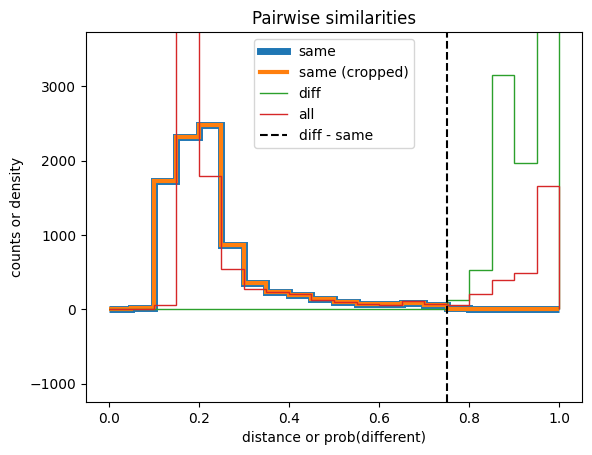

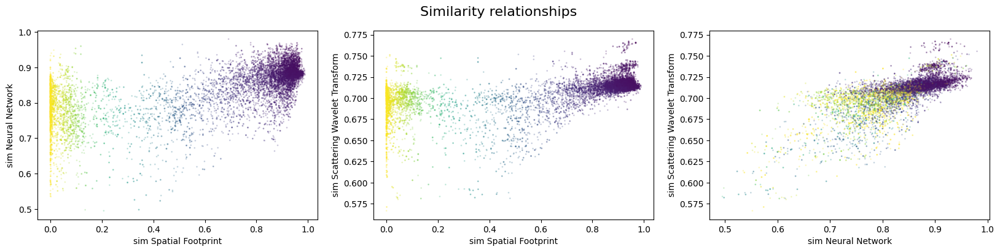

In [39]:
clusterer.plot_distSame(kwargs_makeConjunctiveDistanceMatrix=kwargs_makeConjunctiveDistanceMatrix_best)

clusterer.plot_similarity_relationships(
    plots_to_show=[1,2,3], 
    max_samples=100000,  ## Make smaller if it is running too slow
    kwargs_scatter={'s':1, 'alpha':0.2},
    kwargs_makeConjunctiveDistanceMatrix=kwargs_makeConjunctiveDistanceMatrix_best
);

##### 2. Prune the distance matrix

We can remove all connections in the distance graph with probabilities of connection of less than 50%. We estimate this cutoff distance as the cross-over point between the 'same' and 'different' distributions.

**Important parameter**\
`stringency`: This value changes the threshold for pruning the distance matrix. A higher value will result in less pruning, and a lower value will result in more pruning. The value will be multiplied by the inferred threshold to get the new one.


In [40]:
clusterer.make_pruned_similarity_graphs(
    d_cutoff=None,  ## Optionally manually specify a distance cutoff
    kwargs_makeConjunctiveDistanceMatrix=kwargs_makeConjunctiveDistanceMatrix_best,
    stringency=1.0,  ## Modifies the threshold for pruning the distance matrix. Higher values result in LESS pruning. New d_cutoff = stringency * truncated d_cutoff.
    convert_to_probability=False,    
)

Pruning similarity graphs with d_cutoff = 0.75...


c:\Users\janet\anaconda3\envs\roicat\Lib\site-packages\scipy\sparse\_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


##### 3. Cluster

There are two methods for clustering: The standard method `.fit` which is based on HDBSCAN, and `.fit_sequentialHungarian` which is an algorithm that is also used by CaImAn based on the Hungarian algorithm. The standard method takes 1-20 minutes and works better when there are many sessions, the Hungarian method takes seconds and works better when there are fewer sessions (<8).

**Important parameters**:
- For standard **`.fit`** method:
1. `min_cluster_size`: If you only want ROIs clusters with at least a certain number of samples, specify here.
2. `n_iter_violationCorrection`: This parameter controls how fast this step takes. Turning it down has mild effects on quality. We use around ***6***.

- For **`.fit_sequentialHungarian`** method:
1. `thresh_cost`: Determines the threshold of how distant two ROIs can be and still be matched. Smaller value is more stringent.


In [41]:
if data.n_sessions >= 6:
    labels = clusterer.fit(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        min_cluster_size=2,  ## Minimum number of ROIs that can be considered a 'cluster'
        n_iter_violationCorrection=6,  ## Number of times to redo clustering sweep after removing violations
        split_intraSession_clusters=True,  ## Whether or not to split clusters with ROIs from the same session
        cluster_selection_method='leaf',  ## (advanced) Method of cluster selection for HDBSCAN (see hdbscan documentation)
        d_clusterMerge=None,  ## Distance below which all ROIs are merged into a cluster
        alpha=0.999,  ## (advanced) Scalar applied to distance matrix in HDBSCAN (see hdbscan documentation)
        discard_failed_pruning=True,  ## (advanced) Whether or not to set all ROIs that could be separated from clusters with ROIs from the same sessions to label=-1
        n_steps_clusterSplit=100,  ## (advanced) How finely to step through distances to remove violations
    )

else:
    labels = clusterer.fit_sequentialHungarian(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        thresh_cost=0.8,  ## Threshold. Higher values result in more permissive clustering. Specifically, the pairwise metric distance between ROIs above which two ROIs cannot be clustered together.
    )

Fitting with HDBSCAN and splitting clusters with multiple ROIs per session


 17%|█▋        | 1/6 [00:00<00:00,  5.12it/s]

Initial number of violating clusters: 6
Initial number of violating clusters: 3


 33%|███▎      | 2/6 [00:00<00:00,  5.18it/s]

Initial number of violating clusters: 3


 50%|█████     | 3/6 [00:00<00:00,  5.24it/s]

Initial number of violating clusters: 3


 67%|██████▋   | 4/6 [00:00<00:00,  5.27it/s]

Initial number of violating clusters: 3


 83%|████████▎ | 5/6 [00:00<00:00,  5.28it/s]

Initial number of violating clusters: 3


100%|██████████| 6/6 [00:01<00:00,  5.79it/s]


##### 4. Quality metrics

Compute various quality scores for each cluster and each ROI.

In [42]:
## SKIP THIS STEP FOR VERY LARGE DATASETS
quality_metrics = clusterer.compute_quality_metrics();

## Collect results

1. Make different versions of the labels for convenience.
2. Put all the useful results and info into a dictionary to save later. ADJUST THIS ANY WAY YOU WANT.
3. Put all the class objects from the run into a dictionary to save later

In [43]:
labels_squeezed, labels_bySession, labels_bool, labels_bool_bySession, labels_dict = roicat.tracking.clustering.make_label_variants(labels=labels, n_roi_bySession=data.n_roi)

results_clusters = {
    'labels': labels_squeezed,
    'labels_bySession': labels_bySession,
    'labels_dict': labels_dict,
    'quality_metrics': quality_metrics,
}

results_all = {
    "clusters":{
        "labels": roicat.util.JSON_List(labels_squeezed),
        "labels_bySession": roicat.util.JSON_List(labels_bySession),
        "labels_bool": labels_bool,
        "labels_bool_bySession": labels_bool_bySession,
        "labels_dict": roicat.util.JSON_Dict(labels_dict),
        "quality_metrics": roicat.util.JSON_Dict(clusterer.quality_metrics) if hasattr(clusterer, 'quality_metrics') else None,
    },
    "ROIs": {
        "ROIs_aligned": aligner.ROIs_aligned,
        "ROIs_raw": data.spatialFootprints,
        "frame_height": data.FOV_height,
        "frame_width": data.FOV_width,
        "idx_roi_session": np.where(data.session_bool)[1],
        "n_sessions": data.n_sessions,
    },
    "input_data": {
        "paths_stat": data.paths_stat,
        "paths_ops": data.paths_ops,
    },
}

run_data = {
    'data': data.__dict__,
    'aligner': aligner.__dict__,
    'blurrer': blurrer.__dict__,
    'roinet': roinet.__dict__,
    'swt': swt.__dict__,
    'sim': sim.__dict__,
    'clusterer': clusterer.__dict__,
}

params_used = {name: mod['params'] for name, mod in run_data.items()}

# Visualize results

In [44]:
print(f'Number of clusters: {len(np.unique(results_clusters["labels"]))}')
print(f'Number of discarded ROIs: {(np.array(results_clusters["labels"])==-1).sum()}')

Number of clusters: 118
Number of discarded ROIs: 256


Look at some of the distributions of the quality metrics.
- Silhouette score is a particularly useful one for this type of clustering. Learn more here: https://en.wikipedia.org/wiki/Silhouette_(clustering)
- We also define a handy 'confidence' variable which is a nice heuristic you can use for thresholding for inclusion criteria
- Note that the `sample_silhouette` score is a per-sample (per-ROI) score. So it can actually be used to remove / subselect ROIs from clusters.

A good rule of thumb is to use an inclusion criteria of:
- `sample_silhouette` > 0.1
- `cluster_silhouette` > 0.2

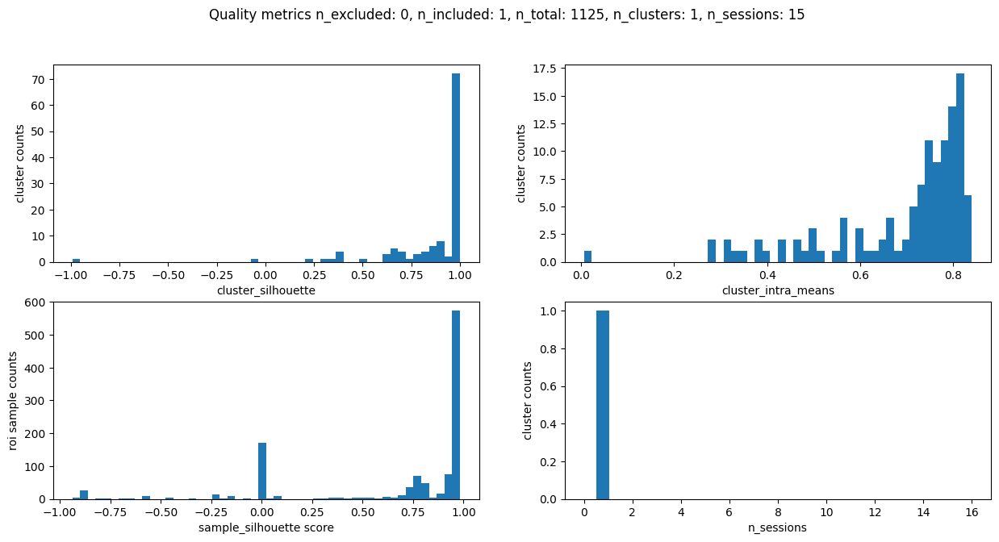

In [45]:
roicat.tracking.clustering.plot_quality_metrics(quality_metrics=quality_metrics, labels=labels_squeezed, n_sessions=data.n_sessions);

Look at a color visualization of the results. ROIs of the same color are considered a part of the same cluster. The colors are assigned randomly.

c:\users\janet\documents\github\roicat\roicat\visualization.py:247: RuntimeWarning: divide by zero encountered in divide
  rois = rois.multiply(1.0/rois.max(1).toarray()).power(1)



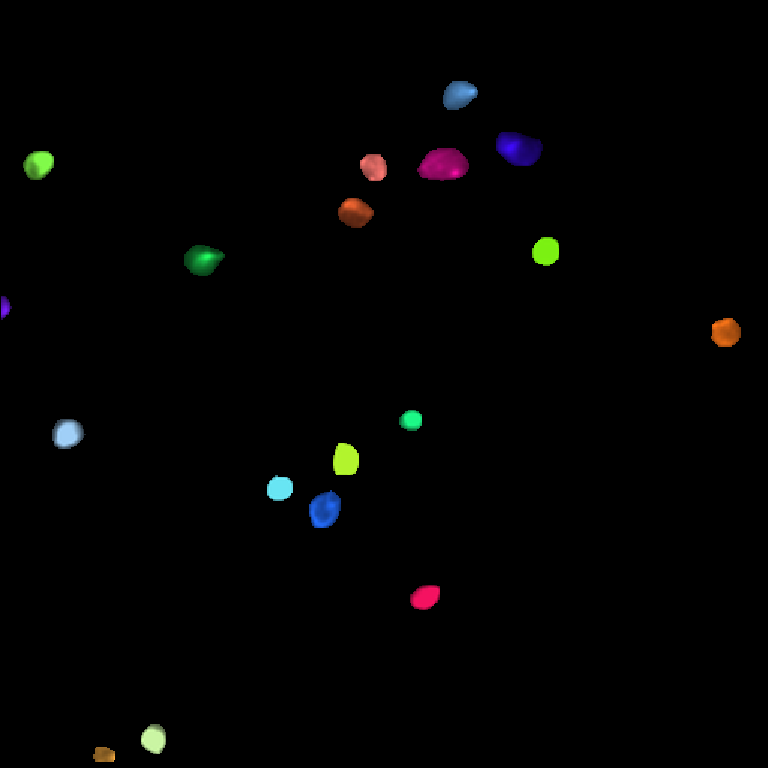

In [46]:
FOV_clusters = roicat.visualization.compute_colored_FOV(
    spatialFootprints=[r.power(1.0) for r in results_all['ROIs']['ROIs_aligned']],  ## Spatial footprint sparse arrays
    FOV_height=results_all['ROIs']['frame_height'],
    FOV_width=results_all['ROIs']['frame_width'],
    labels=results_all["clusters"]["labels_bySession"],  ## cluster labels
#     labels=(np.array(results["clusters"]["labels"])!=-1).astype(np.int64),  ## cluster labels
    # alphas_labels=confidence*1.5,  ## Set brightness of each cluster based on some 1-D array
#     alphas_labels=(clusterer.quality_metrics['cluster_silhouette'] > 0) * (clusterer.quality_metrics['cluster_intra_means'] > 0.4),
#     alphas_sf=clusterer.quality_metrics['sample_silhouette'],  ## Set brightness of each ROI based on some 1-D array
)

roicat.visualization.display_toggle_image_stack(
    FOV_clusters, 
    image_size=1.5,
#     clim=[0,1.0],
)

Visualize the images of ROIs from the same cluster

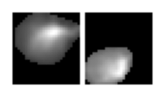

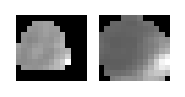

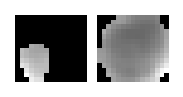

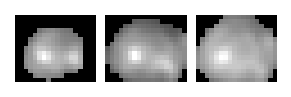

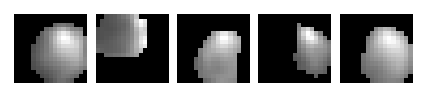

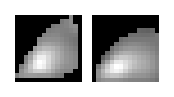

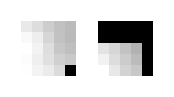

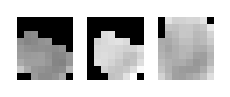

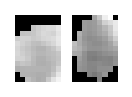

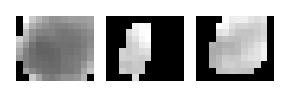

In [47]:
roicat.visualization.display_cropped_cluster_ims(
    spatialFootprints=results_all['ROIs']['ROIs_aligned'],
    labels=np.array(results_all["clusters"]["labels"]),
    FOV_height=results_all['ROIs']['frame_height'],
    FOV_width=results_all['ROIs']['frame_width'],
    n_labels_to_display=10,    
)

# Save results

In [36]:
## Define the directory to save the results to
dir_save = '/media/rich/bigSSD/data_tmp/test_data/'
name_save = 'mouse_1'

paths_save = {
    'results_clusters': str(Path(dir_save) / f'{name_save}.tracking.results_clusters.json'),
    'params_used':      str(Path(dir_save) / f'{name_save}.tracking.params_used.json'),
    'results_all':      str(Path(dir_save) / f'{name_save}.tracking.results_all.richfile'),
    'run_data':         str(Path(dir_save) / f'{name_save}.tracking.run_data.richfile'),
}


In [ ]:
Path(dir_save).mkdir(parents=True, exist_ok=True)

roicat.helpers.json_save(obj=results_clusters, filepath=paths_save['results_clusters'])
roicat.helpers.json_save(obj=params_used, filepath=paths_save['params_used'])
roicat.util.RichFile_ROICaT(path=paths_save['results_all']).save(obj=results_all, overwrite=True)
roicat.util.RichFile_ROICaT(path=paths_save['run_data']).save(obj=run_data, overwrite=True)

Optionally save the FOV_clusters images as a GIF

In [38]:
roicat.helpers.save_gif(
    array=roicat.helpers.add_text_to_images(
        images=[(f * 255).astype(np.uint8) for f in FOV_clusters], 
        text=[[f"{ii}",] for ii in range(len(FOV_clusters))], 
        font_size=3,
        line_width=10,
        position=(30, 90),
    ), 
    path=str(Path(dir_save).resolve() / 'FOV_clusters.gif'),
    frameRate=10.0,
    loop=0,
)

# Extras

##### Demo: Importing richfiles

Simple output files are saved as .json files, which are easily handled. However, complex output files are saved using a custom format called `richfile`, which are basically just structured directories containing data files. This is a demonstration of how to import and handle richfile directories.

In [ ]:
## Make a richfile object of the results_all dictionary
r = roicat.util.RichFile_ROICaT(path=paths_save['results_all'])

## You can load it
temp_results_all = r.load()

## You can load part of it by indexing into the richfile object
print(f"n_sessions: {r['ROIs']['n_sessions'].load()}")
print('')

## You can view the tree structure
r.view_tree()

##### Legacy saving methods

In [ ]:
dir_save = Path('/media/rich/bigSSD/data_tmp/test_data/').resolve()
name_save = Path(dir_allOuterFolders).resolve().name

path_save = dir_save / (name_save + '.ROICaT.tracking.results' + '.pkl')
print(f'path_save: {path_save}')

In [41]:
run_data_sd = {
    'data': data.serializable_dict,
    'aligner': aligner.serializable_dict,
    'blurrer': blurrer.serializable_dict,
    'roinet': roinet.serializable_dict,
    'swt': swt.serializable_dict,
    'sim': sim.serializable_dict,
    'clusterer': clusterer.serializable_dict,
}

In [42]:
roicat.helpers.pickle_save(
    obj=results_all,
    filepath=path_save,
    mkdir=True,
)

roicat.helpers.pickle_save(
    obj=run_data_sd,
    filepath=str(dir_save / (name_save + '.ROICaT.tracking.rundata' + '.pkl')),
    mkdir=True,
)


Optionally save results as a matlab file.

In [43]:
roicat.helpers.matlab_save(
    obj=results_all,
    filepath=str(dir_save / (name_save + '.ROICaT.tracking.results' + '.mat')),
)